In [ ]:
!pip install diffusers --upgrade

In [ ]:
!pip install invisible_watermark transformers accelerate safetensors

In [ ]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")

In [4]:
import torch
generator = torch.Generator().manual_seed(33)

### Prompts Engineering

  0%|          | 0/50 [00:00<?, ?it/s]

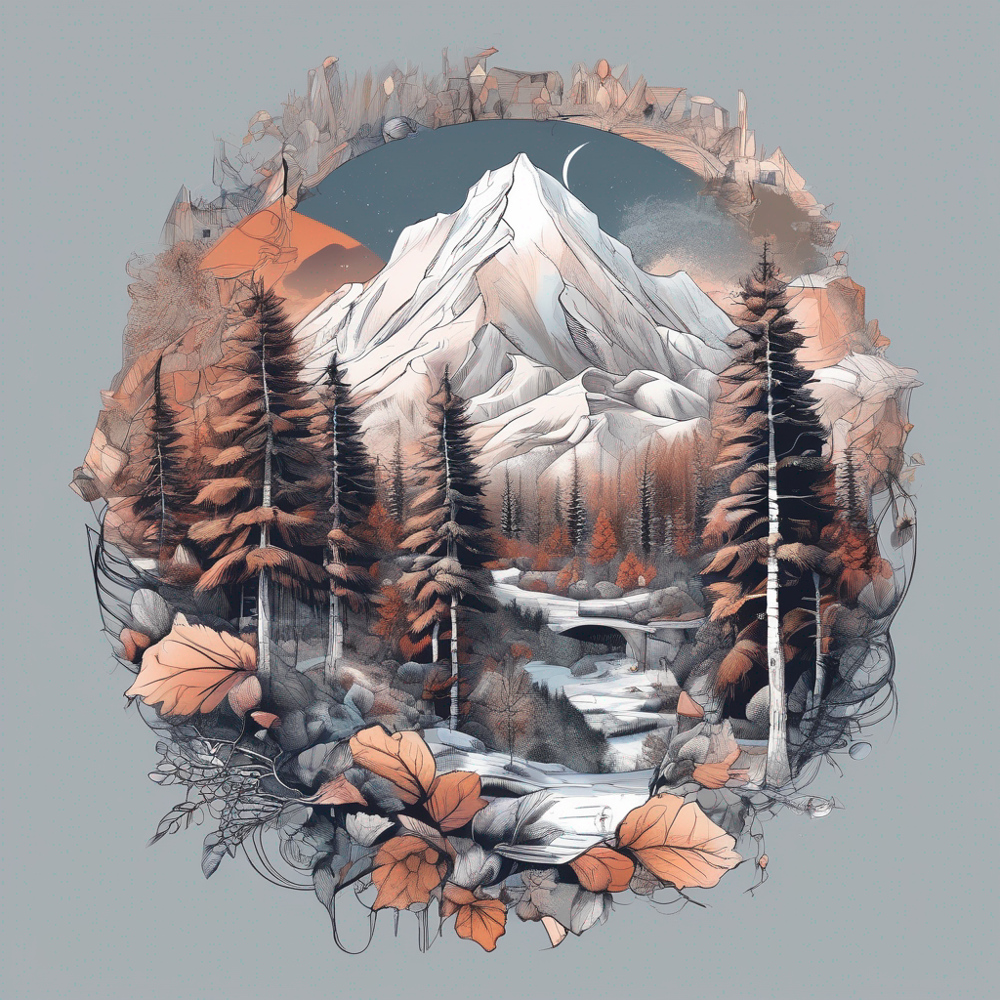

In [7]:
prompt = "mountain season with cold climate"
negative_prompt="extra digit, fewer digits, cropped, worst quality, low quality, camera"
image = pipe(prompt=prompt, generator=generator,negative_prompt = negative_prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

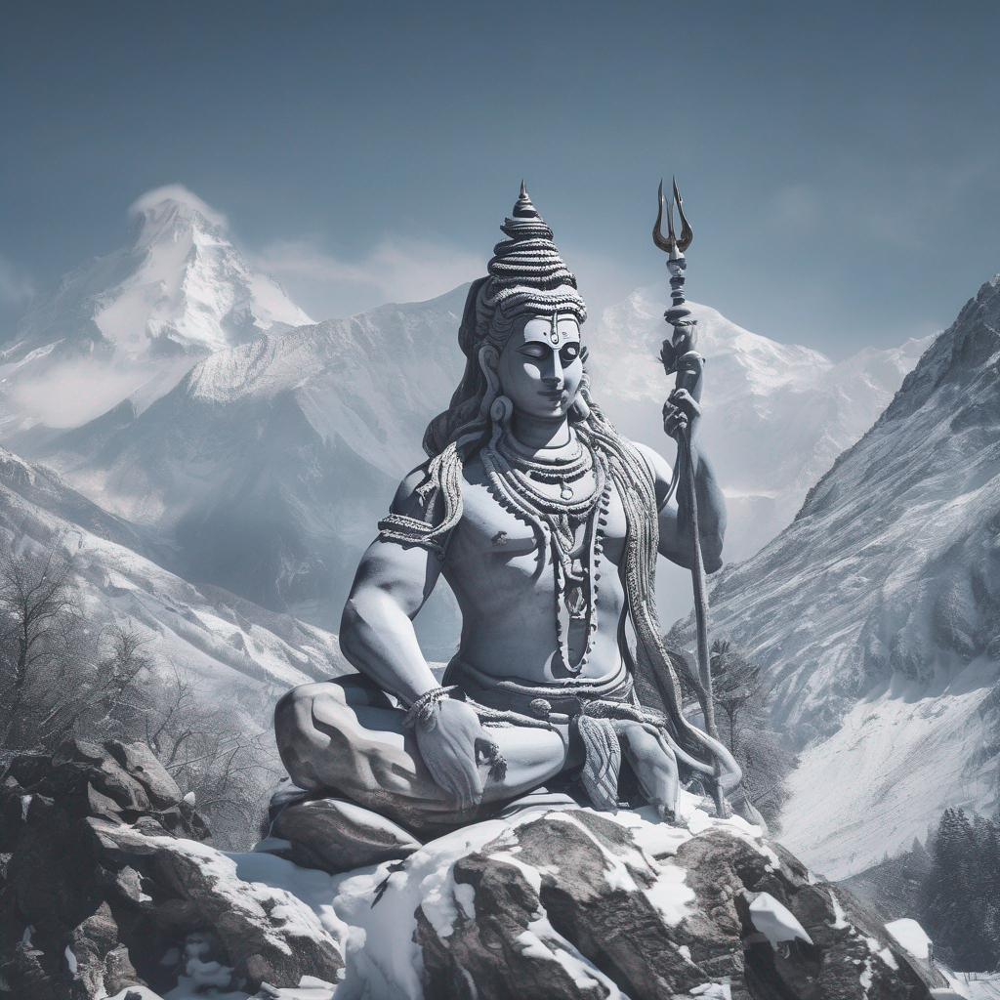

In [8]:
prompt = "Full Frame beautiful Lord Shiva, mountain season with cold climate"
negative_prompt="extra digit, fewer digits, cropped, worst quality, low quality, camera"
image = pipe(prompt=prompt, generator=generator,negative_prompt = negative_prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

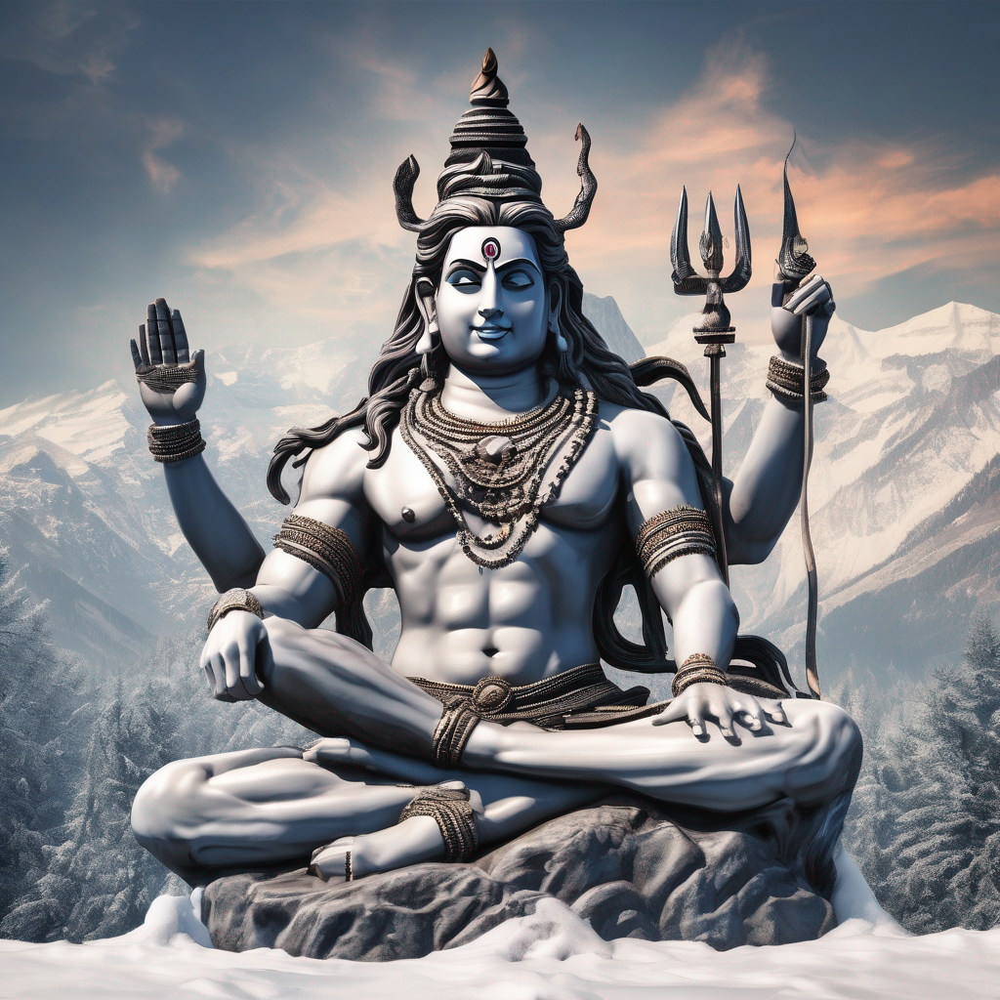

In [9]:
prompt = "Full Frame beautiful Lord Shiva, (with proper hands,1.1) , (with proper legs,1.1), mountain season with cold climate"
negative_prompt="extra digit, fewer digits, cropped, worst quality, low quality, camera, incomplete picture, camera"
image = pipe(prompt=prompt, generator=generator,negative_prompt = negative_prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

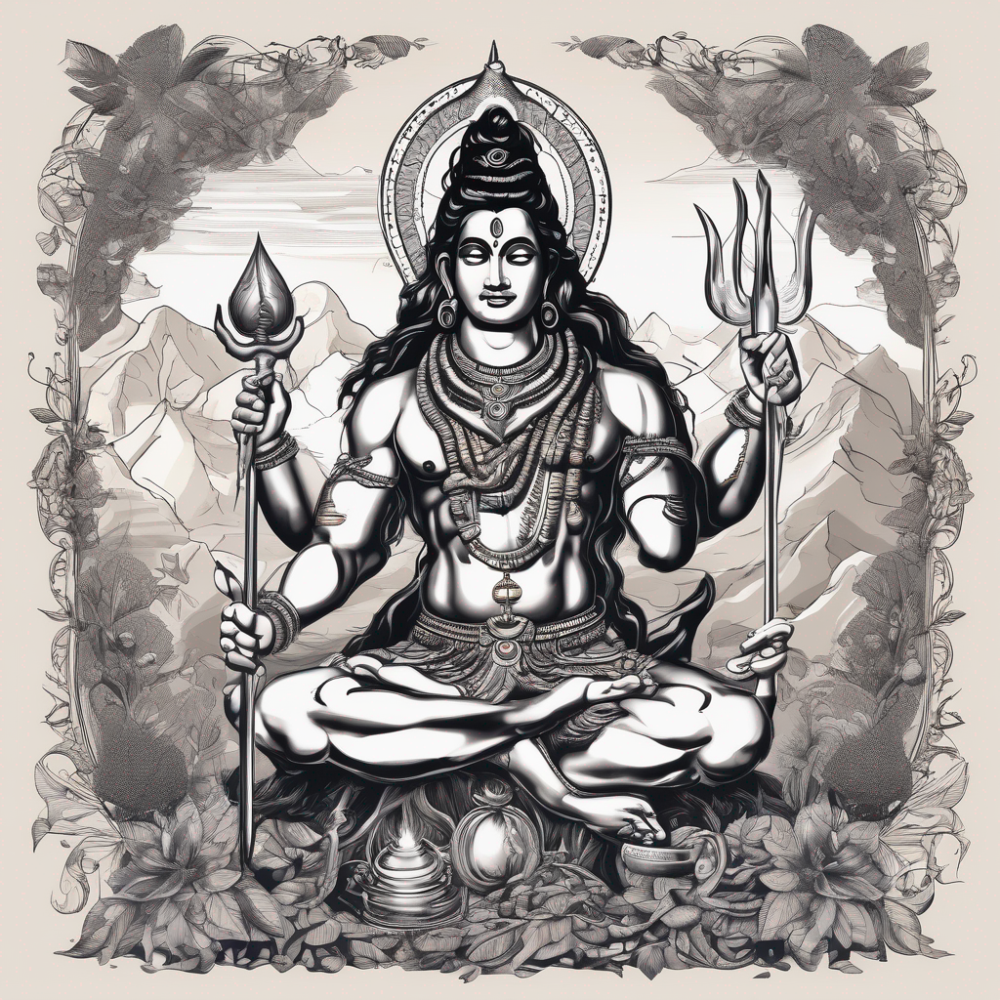

In [10]:
prompt = "Full Frame beautiful Lord Shiva, (with proper hands,1.2) , (with proper legs,1.2), mountain season with cold climate, seed=12345"
negative_prompt="extra digit, fewer digits, cropped, worst quality, low quality, camera, incomplete picture, camera"
image = pipe(prompt=prompt, generator=generator,negative_prompt = negative_prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

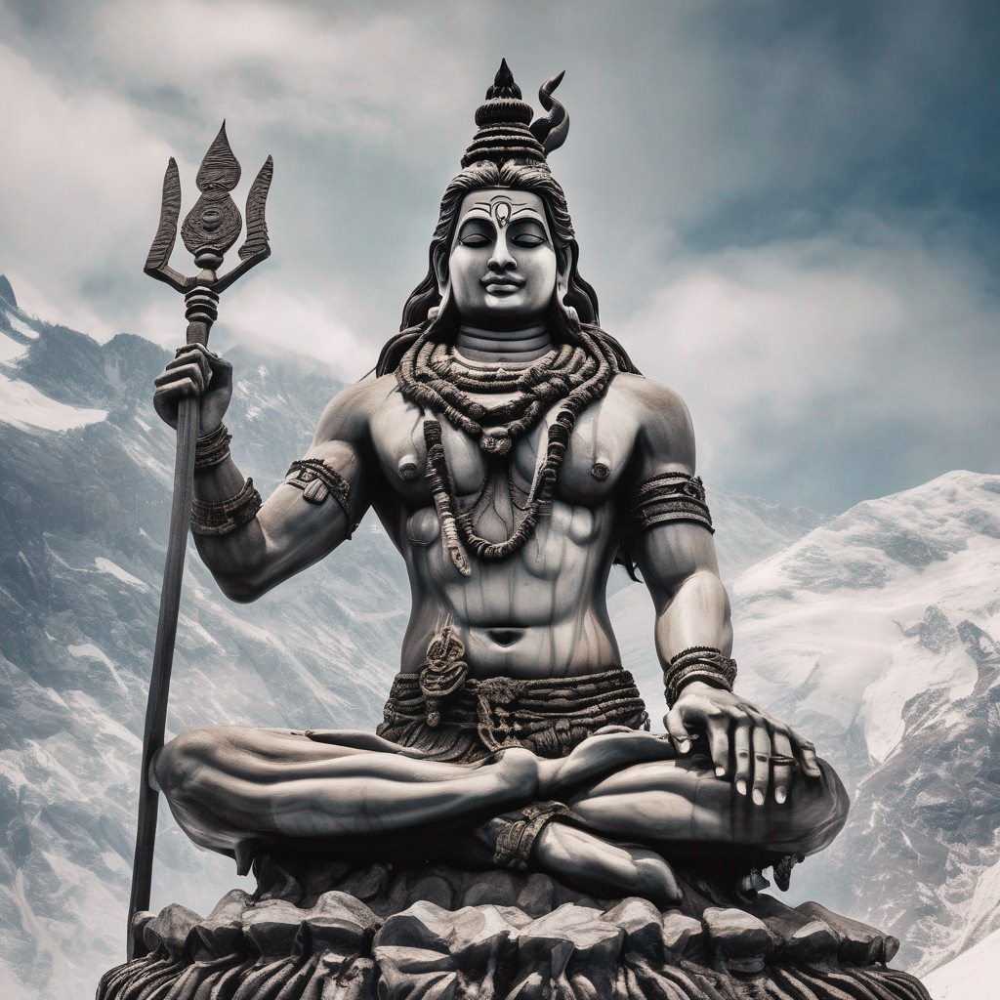

In [11]:
prompt = "Full Frame beautiful Lord Shiva, (with proper hands,0.1) , (with proper legs,0.1), mountain season with cold climate, seed=12345"
negative_prompt="extra digit, fewer digits, cropped, worst quality, low quality, camera, incomplete picture, camera"
image = pipe(prompt=prompt, generator=generator,negative_prompt = negative_prompt).images[0]
image

### Current Issues are:

1. Seeding Issues
2. Weighted Prompt not able to verify due to seeding issue

### Check seeding behaviours

Reference : https://huggingface.co/CompVis/stable-diffusion-v1-4/discussions/15

In [ ]:
!pip install huggingface_hub

In [ ]:
!huggingface-cli login

In [ ]:

import torch
from diffusers import StableDiffusionPipeline

device = "cuda"
model_id = "CompVis/stable-diffusion-v1-4"
prompt = "Labrador in the style of Vermeer"
file = "seed_test_"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    revision="fp16",
    torch_dtype=torch.float16,
    use_auth_token=True,
).to(device)



In [17]:
num_images = 1
width = 512
height = 512

# first try
latents = None
#seed: int = 7183698734589870
seed: int = 0

generator = torch.Generator(device=device)
generator = generator.manual_seed(seed)
latents = torch.randn(
        (1, pipe.unet.in_channels, height // 8, width // 8),
        generator = generator,
        device = device
)

with torch.autocast("cuda"):
    images = pipe([prompt] * num_images,guidance_scale=7.5,latents = latents,)["sample"]
    images[0].save(file + "_test_seed_1.jpg")


<ipython-input-17-9e7b9fec3b85>:13: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (1, pipe.unet.in_channels, height // 8, width // 8),


  0%|          | 0/50 [00:00<?, ?it/s]

KeyError: ignored

In [19]:
prompt = "Labrador in the style of Vermeer"

with torch.autocast("cuda"):
    images = pipe(
        [prompt] * num_images,
        guidance_scale=7.5,
        latents = latents,
    )

  0%|          | 0/50 [00:00<?, ?it/s]

In [23]:
images["sample"]

KeyError: ignored

In [ ]:

# second try
generator = torch.Generator(device=device)
generator = generator.manual_seed(seed)

latents = torch.randn(
        (1, pipe.unet.in_channels, height // 8, width // 8),
        generator = generator,
        device = device
)
with torch.autocast("cuda"):
    images = pipe(
        [prompt] * num_images,
        guidance_scale=7.5,
        latents = latents,
    )["sample"]
    images[0].save(file + "_test_seed_2.jpg")

#third try
with torch.autocast("cuda"):
    images = pipe(
        [prompt] * num_images,
        guidance_scale=7.5,
        latents = latents,
    )["sample"]
    images[0].save(file + "_test_seed_3.jpg")